<a href="https://colab.research.google.com/github/kteppris/RealWaste/blob/main/240218_FLR_RealWaste_EDA_und_RandomForest_HOG_LBP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# RealWaste mit klassischen ML-Methoden bearbeiten

## Installation der erforderlichen Bibliotheken und Import der relevanten Module

### Installation der erforderlichen Bibliotheken

In [ ]:
!pip install tensorflow

In [ ]:
!pip install scikit-image

In [ ]:
!pip install Pillow

In [ ]:
!pip install seaborn

### Import der erforderlichen Module

In [ ]:
import tensorflow as tf
import numpy as np
import sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import cv2
import random
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier

## Datensatz laden und Bilder anzeigen/prüfen

### Datenverzeichnis einrichten

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Ändern Sie diesen Pfad zu dem Ort, an dem sich Ihr RealWaste-Ordner befindet
# data_path = 'drive/mydrive/RealWaste'
%cd drive/MyDrive/RealWaste

/content/drive/MyDrive/RealWaste


In [ ]:
# Überprüfen Sie den aktuellen Arbeitsordner
print("Current Directory:", os.getcwd())

Current Directory: /content/drive/MyDrive/RealWaste


In [ ]:
# Listen Sie die Inhalte des Datenverzeichnisses auf und gibt die Namen der Klassen-Unterordner aus
print("Directory Contents:", os.listdir('.'))

Directory Contents: ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']


### Bilder anzeigen

In [ ]:
pip install opencv-python-headless

Gib mir ein spezifisches, namentlich angegebenes Bild aus:

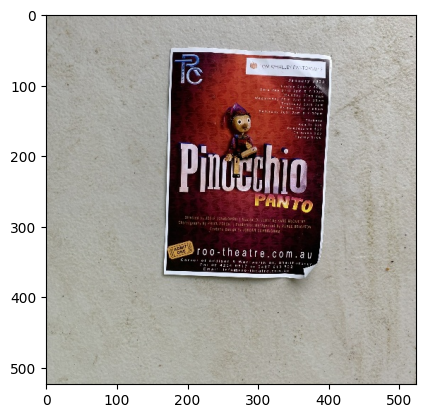

In [ ]:
# Setzen Sie den vollständigen Pfad zum Bild hier ein
image_path = 'Paper/Paper_1.jpg'  # Ersetzen Sie 'name_des_bildes.jpg' mit einem tatsächlichen Bilddateinamen

# Überprüfen Sie, ob der Pfad existiert
if os.path.exists(image_path):
    # Bild laden
    image = cv2.imread(image_path)

    # Überprüfen Sie, ob das Bild korrekt geladen wurde
    if image is not None:
        # Konvertieren von BGR zu RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Bild anzeigen
        plt.imshow(image)
        plt.show()
    else:
        print("Das Bild konnte nicht geladen werden. Überprüfen Sie den Dateipfad und den Dateinamen.")
else:
    print(f"Der Pfad existiert nicht: {image_path}")


Gib mir das nte Bild aus dem Ordner 'Paper' aus, setze hierfür n

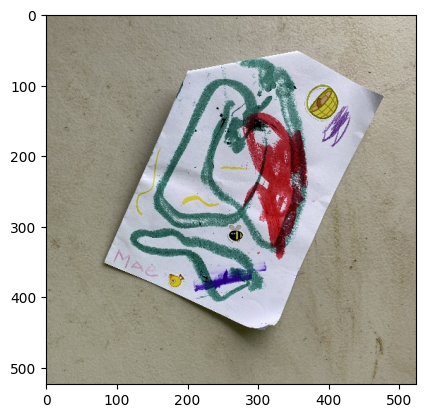

In [ ]:
n = 15 # wird benötigt, um mir später das nte Bild im Ordner auszugeben.

# ---------------------

# Pfad zum Klassenordner
folder_path = 'Paper'

# Alle Dateien im Verzeichnis auflisten
files = os.listdir(folder_path)

# Stellen Sie sicher, dass mindestens fünf Bilder vorhanden sind
if len(files) >= 5:
    # Das fünfte Bild in der Liste auswählen
    fifth_file = files[n]  # Indexierung beginnt bei 0, also ist 4 das fünfte Element

    # Vollständigen Pfad zur Datei erstellen
    image_path = os.path.join(folder_path, fifth_file)

    # Bild laden
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Konvertieren von BGR zu RGB

    # Bild anzeigen
    plt.imshow(image)
    plt.show()
else:
    print("Es gibt nicht genug Bilder im Verzeichnis.")

## Datenexploration

### Anzahl Bilder pro Klasse zählen und visualisieren

In [ ]:
data_path = '.' # beziehe dich auf den aktuellen Ordnerpfad mit '.'.
# Der korrekte Ordnerpfad wurde bereits weiter oben ausgewählt.

# Alle Klassenordner auflisten
classes = os.listdir(data_path)

# Statistiken initialisieren
images_per_class = {}

for class_name in classes:
    # Pfad zum Klassenordner
    class_path = os.path.join(data_path, class_name)

    # Alle Dateien in diesem Klassenordner auflisten
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Anzahl der Bilder in diesem Klassenordner zählen
    image_count = len(images)
    images_per_class[class_name] = image_count

# Ergebnisse ausgeben
for class_name, count in images_per_class.items():
    print(f"Class '{class_name}' has {count} images")

Class 'Cardboard' has 461 images
Class 'Food Organics' has 411 images
Class 'Glass' has 420 images
Class 'Metal' has 790 images
Class 'Miscellaneous Trash' has 495 images
Class 'Paper' has 500 images
Class 'Plastic' has 921 images
Class 'Textile Trash' has 318 images
Class 'Vegetation' has 436 images


### Visualisierung des Zwischenergebnisses

<ipython-input-14-9e44ff841c7d>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=image_counts, y=class_names, palette="viridis")


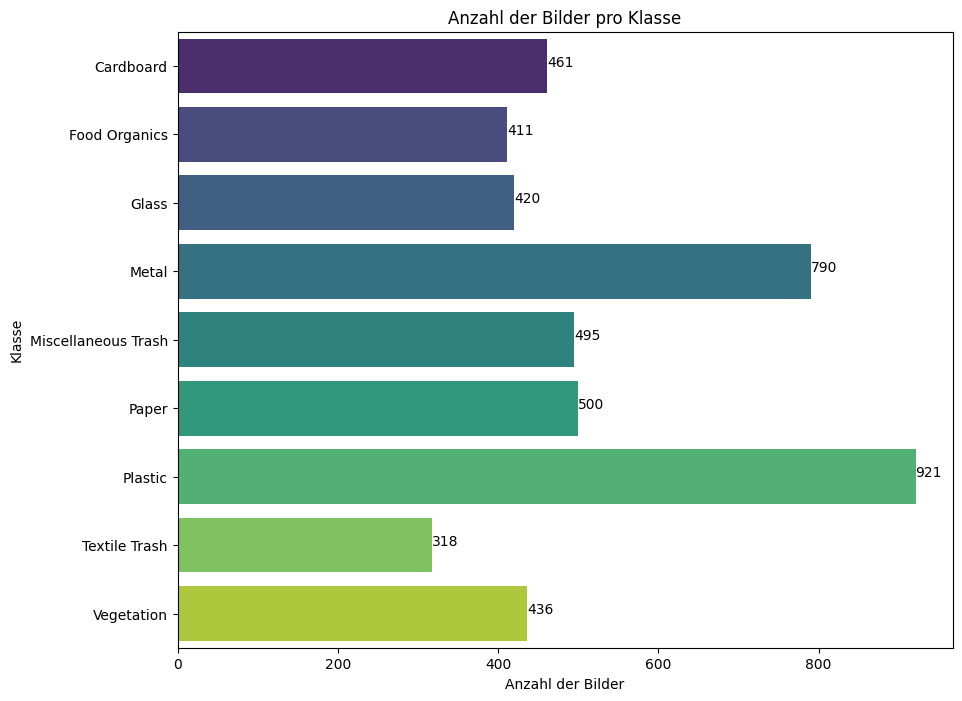

In [ ]:
# Daten für das Balkendiagramm vorbereiten
class_names = list(images_per_class.keys())
image_counts = list(images_per_class.values())

# Balkendiagramm erstellen
plt.figure(figsize=(10, 8))
sns.barplot(x=image_counts, y=class_names, palette="viridis")
plt.title('Anzahl der Bilder pro Klasse')
plt.xlabel('Anzahl der Bilder')
plt.ylabel('Klasse')

# Beschriftungen hinzufügen
for index, value in enumerate(image_counts):
    plt.text(value, index, str(value))

plt.show()

#### Zeige mir beispielhaft je 3 Bilder pro Klasse an

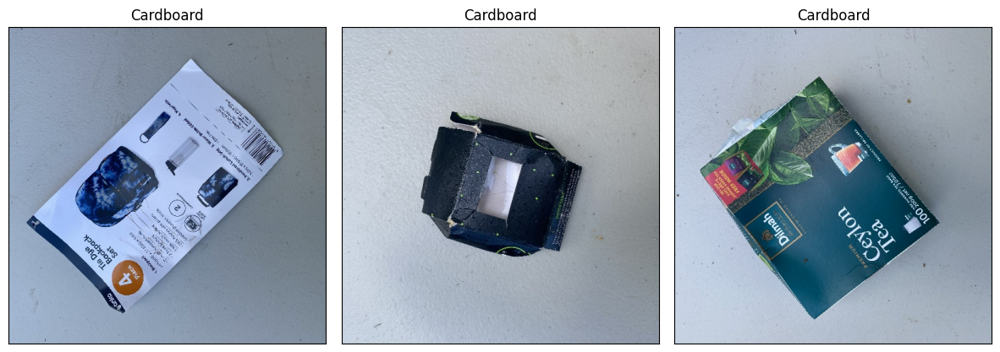

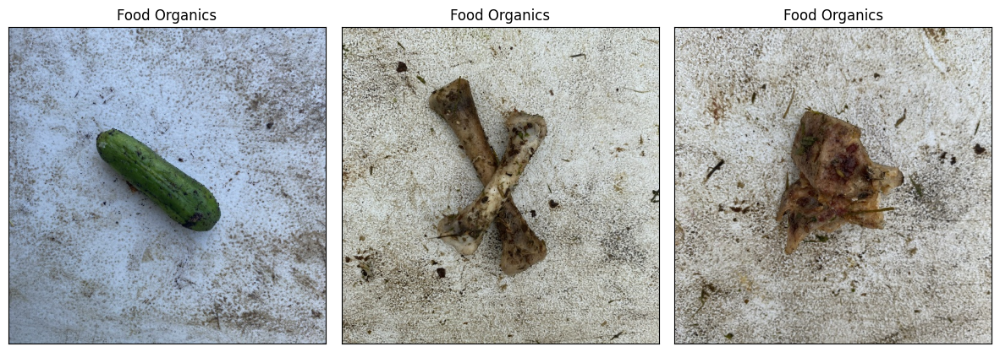

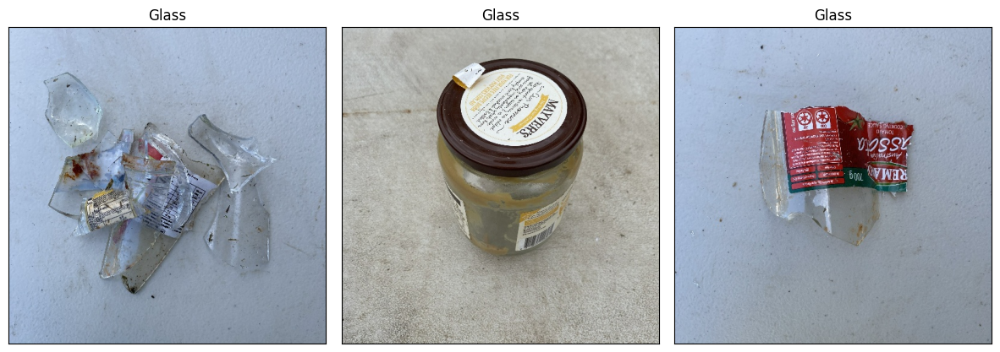

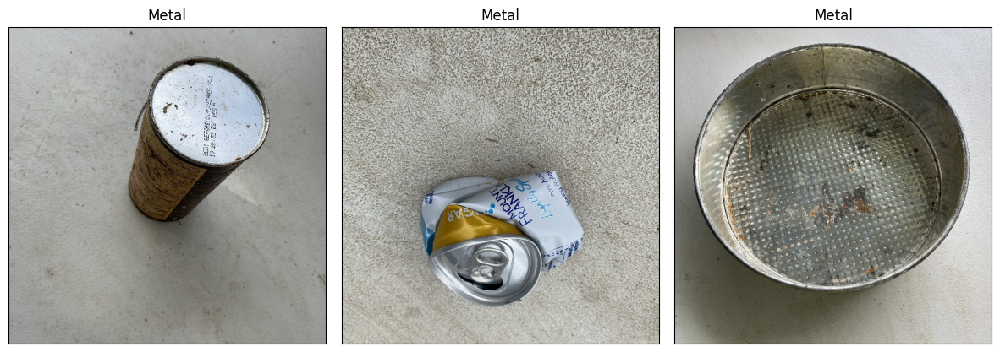

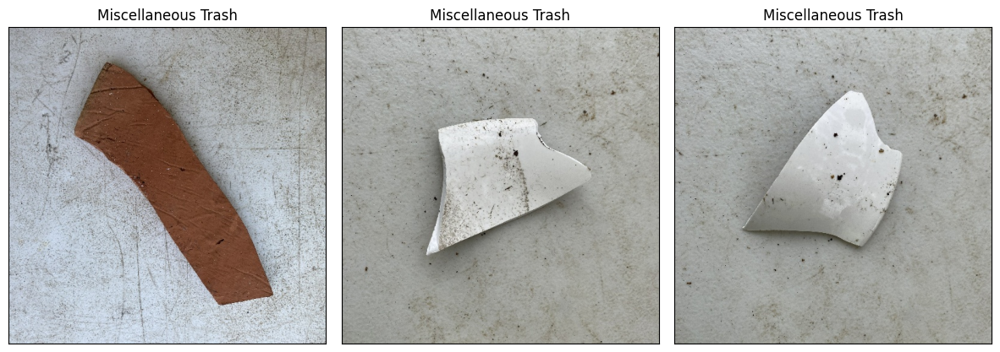

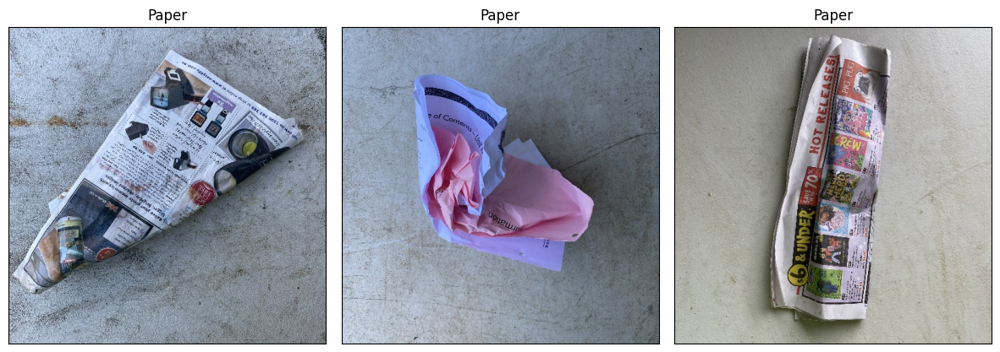

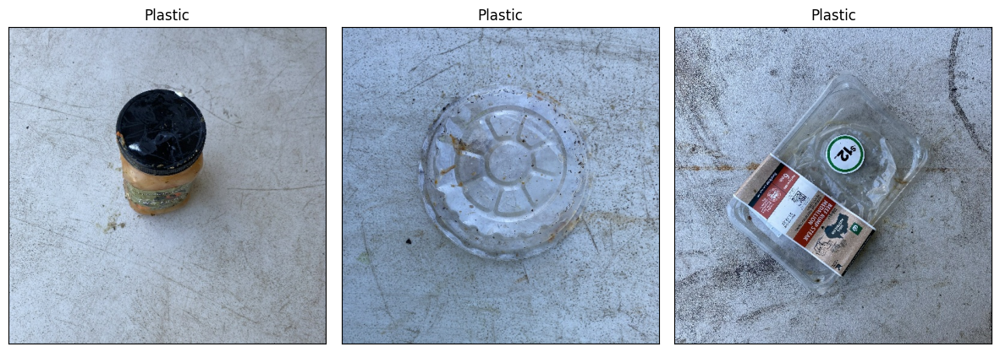

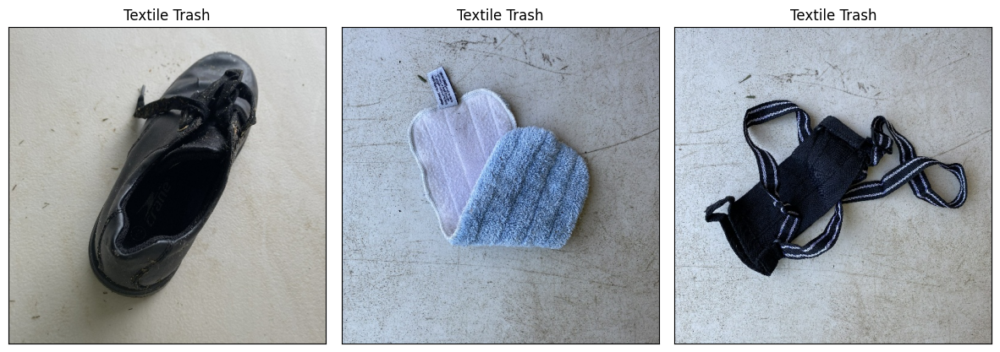

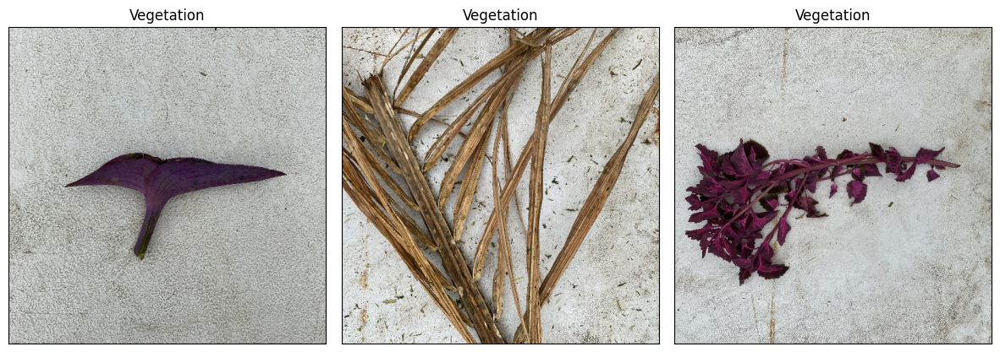

In [ ]:
def display_images_from_each_class(data_path, num_images=3):
    classes = os.listdir(data_path)
    for class_name in classes:
        class_path = os.path.join(data_path, class_name)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        selected_images = random.sample(images, min(len(images), num_images))
        fig, axes = plt.subplots(1, min(len(images), num_images), figsize=(5*num_images, 5), subplot_kw={'xticks':[], 'yticks':[]})
        fig.subplots_adjust(hspace=0.3, wspace=0.05)
        for ax, image_name in zip(axes.flat, selected_images):
            image_path = os.path.join(class_path, image_name)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            ax.imshow(image)
            ax.set_title(class_name)
        plt.show()

display_images_from_each_class(data_path)

#### Verteilung der Bildgrößen analysieren

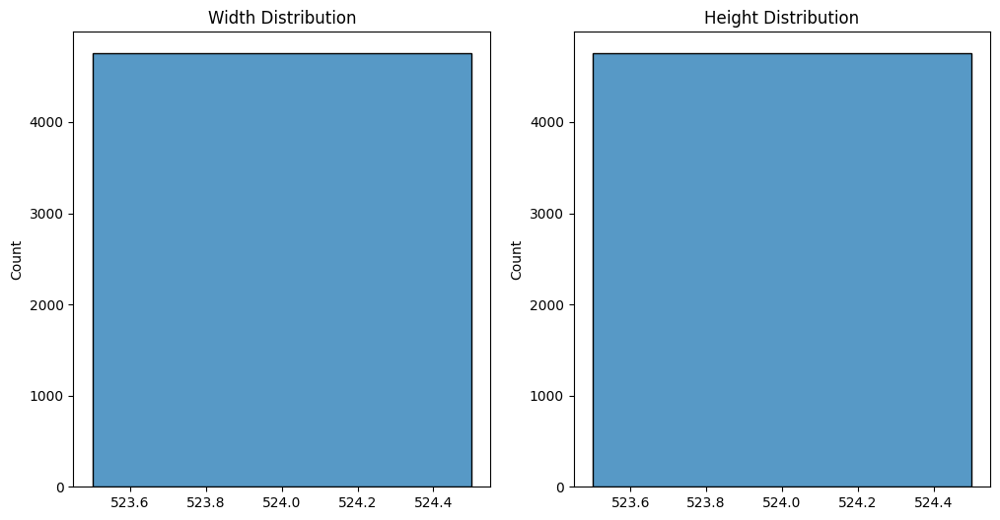

In [ ]:
def plot_image_size_distribution(data_path):
    sizes = []
    for class_name in os.listdir(data_path):
        class_path = os.path.join(data_path, class_name)
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            image = Image.open(image_path)
            sizes.append(image.size)

    # Extract width and height
    widths, heights = zip(*sizes)

    # Plot distribution
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(widths)
    plt.title('Width Distribution')
    plt.subplot(1, 2, 2)
    sns.histplot(heights)
    plt.title('Height Distribution')
    plt.show()

plot_image_size_distribution(data_path)

#### Farbverteilung / Farbhistogramm für die Klassen

Dieser Code lädt ein zufälliges Bild aus jedem Klassenordner und erstellt dann ein Histogramm, das die Verteilung der Intensitätswerte für jeden Farbkanal (Rot, Grün, Blau) zeigt.

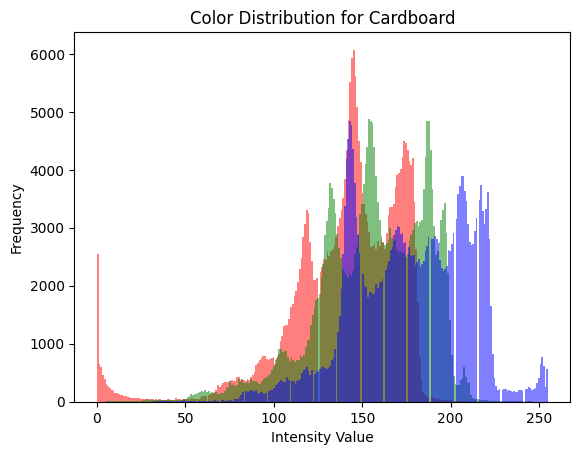

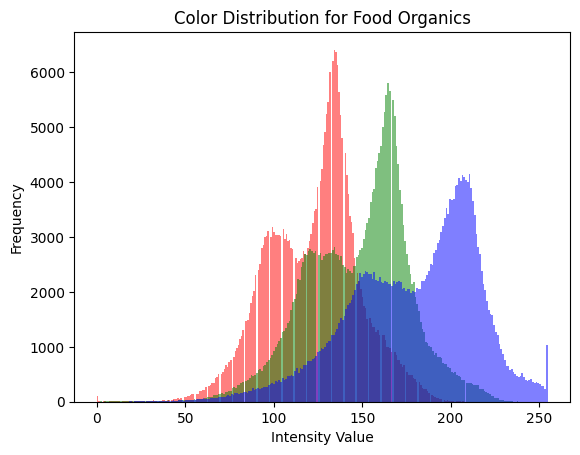

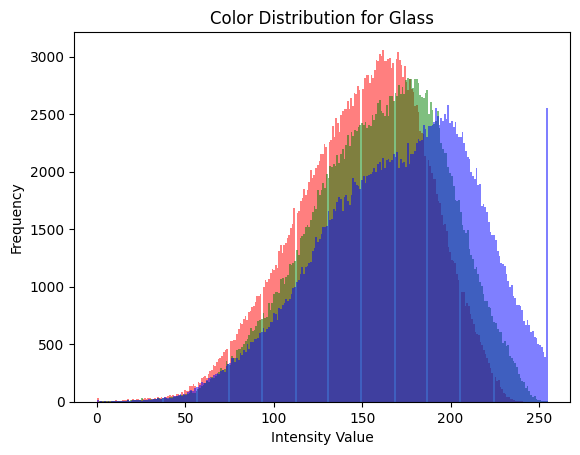

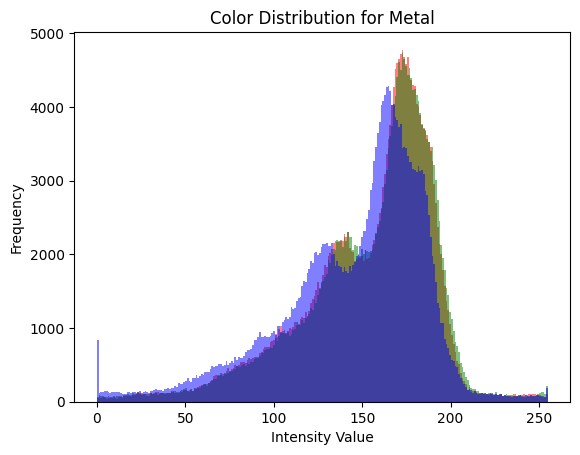

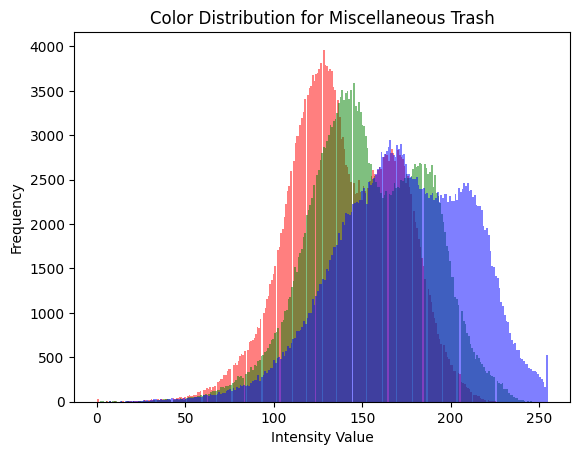

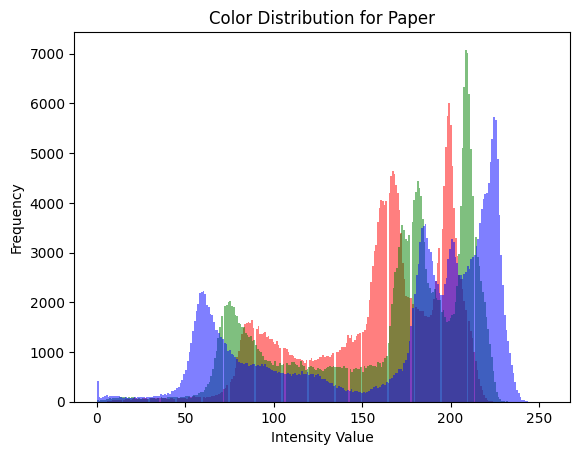

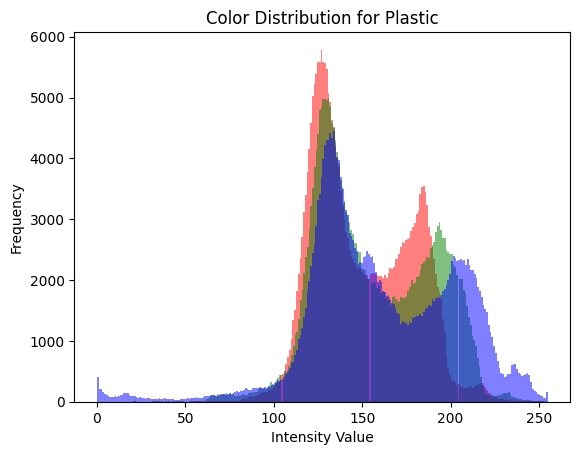

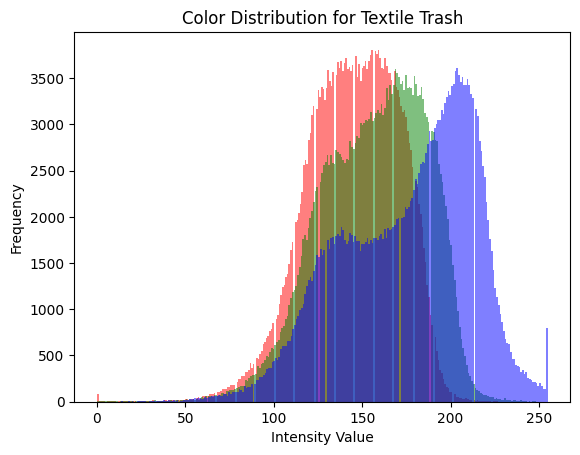

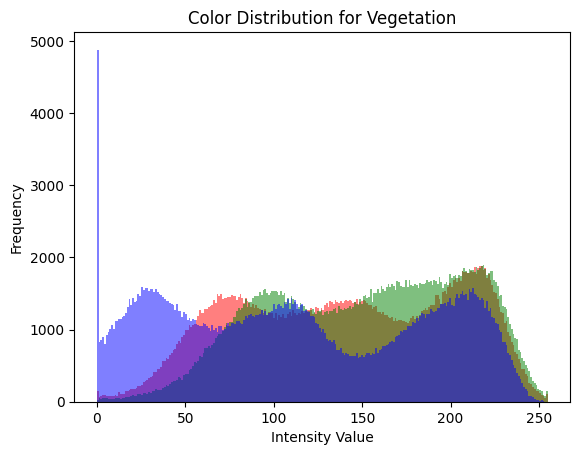

In [ ]:
def plot_color_distribution(data_path, num_images=1):
    classes = os.listdir(data_path)
    for class_name in classes:
        class_path = os.path.join(data_path, class_name)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if len(images) > 0:
            selected_images = random.sample(images, min(len(images), num_images))
            for image_name in selected_images:
                image_path = os.path.join(class_path, image_name)
                image = cv2.imread(image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Flatten the image color channels into a list
                r, g, b = cv2.split(image)
                r = r.flatten()
                g = g.flatten()
                b = b.flatten()

                # Plotting
                fig, ax = plt.subplots()
                ax.hist(r, bins=256, color='red', alpha=0.5)
                ax.hist(g, bins=256, color='green', alpha=0.5)
                ax.hist(b, bins=256, color='blue', alpha=0.5)

                ax.set_xlabel('Intensity Value')
                ax.set_ylabel('Frequency')
                ax.set_title(f'Color Distribution for {class_name}')

                plt.show()

plot_color_distribution(data_path)

Jetzt für alle Bilder in allen Ordnern bzw. für alle Klassen

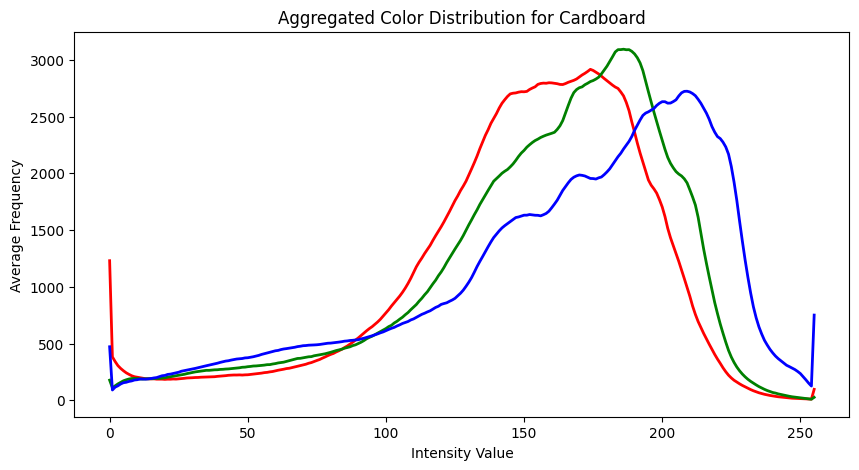

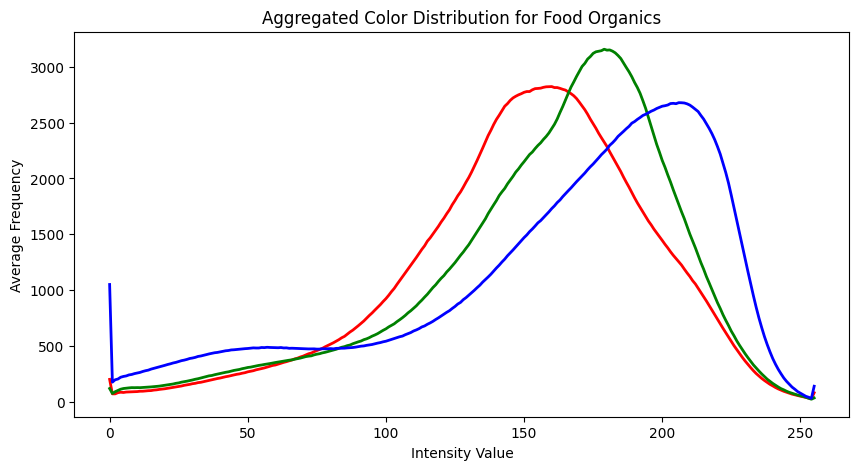

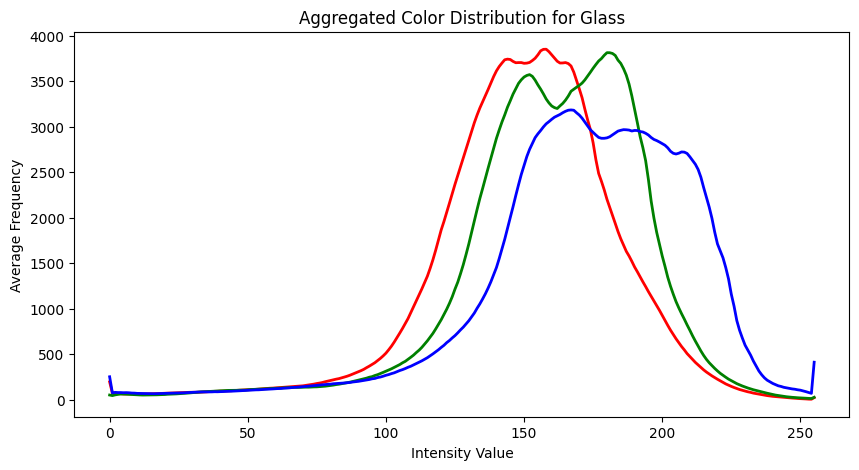

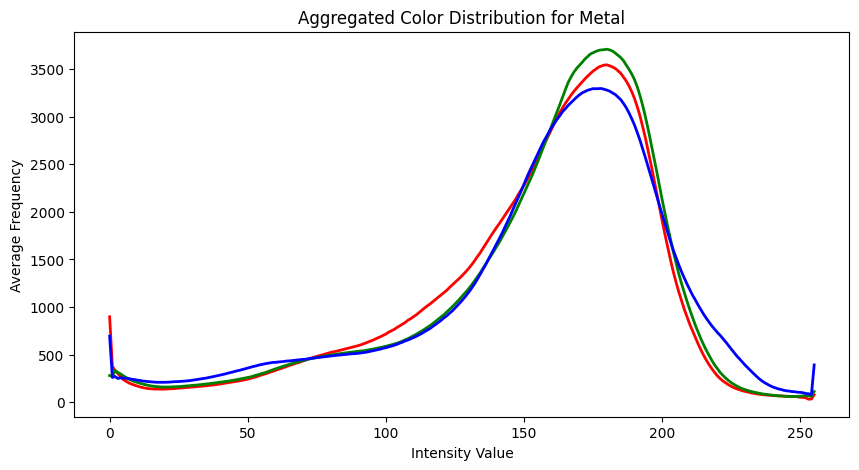

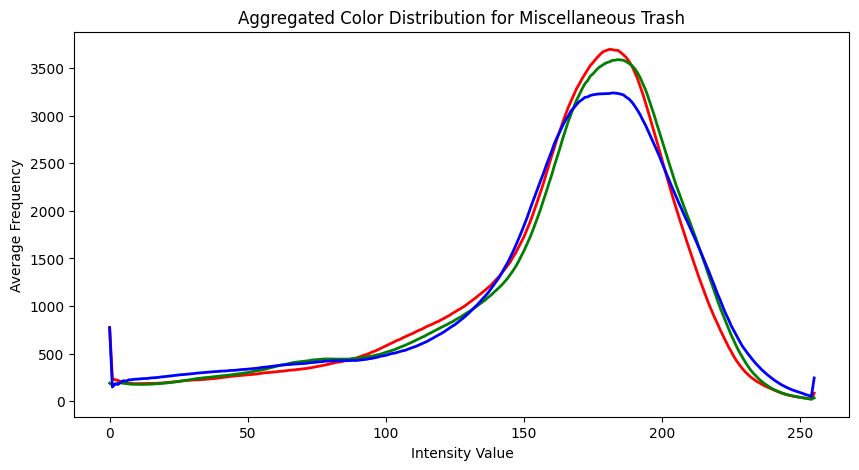

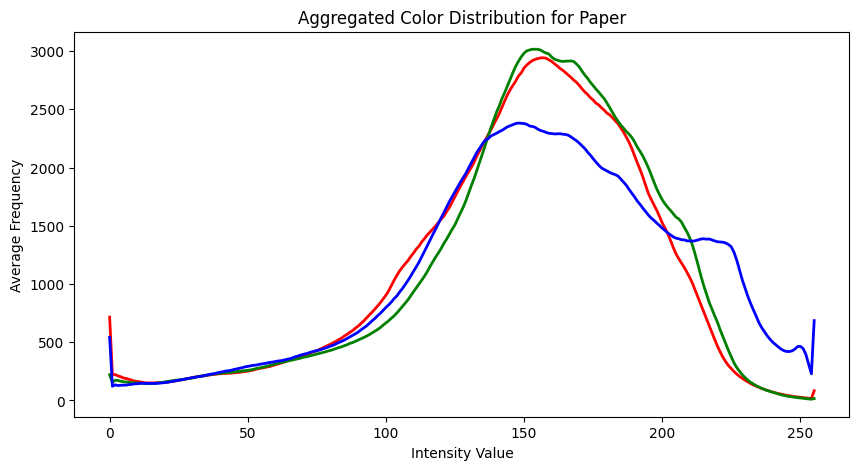

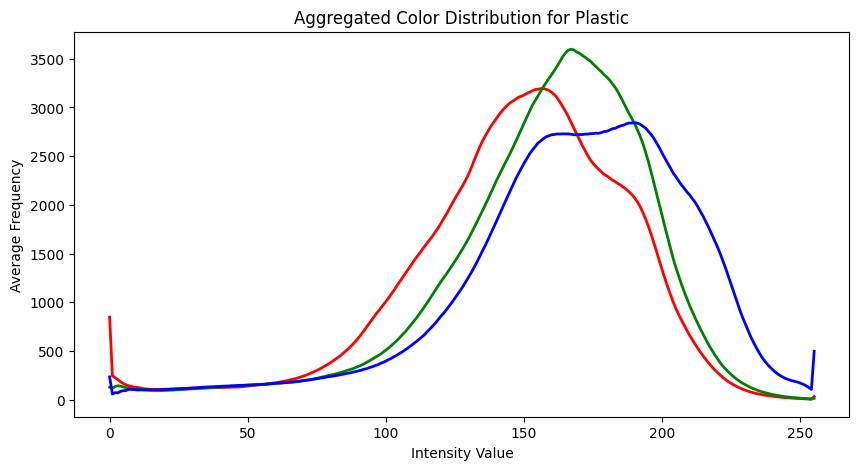

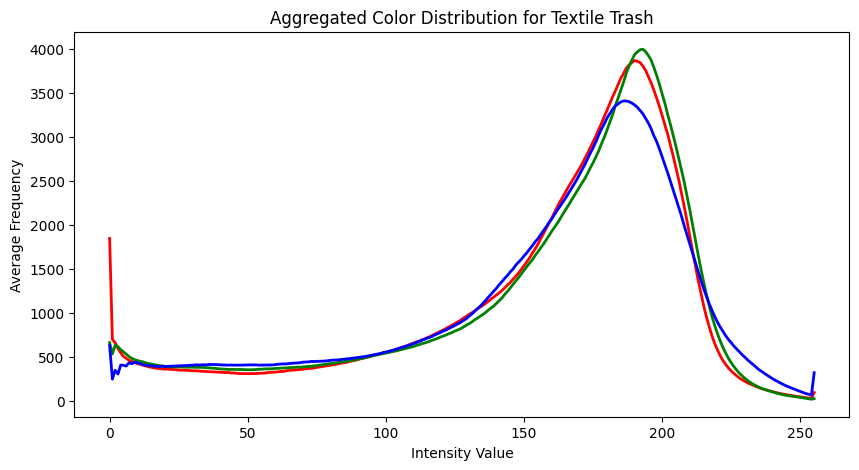

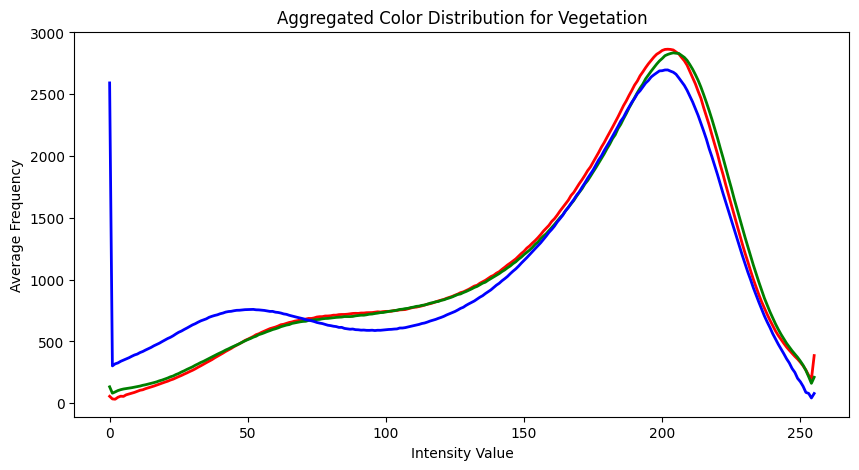

In [ ]:
def plot_aggregated_color_distribution(data_path):
    classes = os.listdir(data_path)

    for class_name in classes:
        class_path = os.path.join(data_path, class_name)
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Aggregate color channels
        aggregated_r = np.zeros(256)
        aggregated_g = np.zeros(256)
        aggregated_b = np.zeros(256)

        for image_name in images:
            image_path = os.path.join(class_path, image_name)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            r, g, b = cv2.split(image)

            # Sum up the histograms for each color channel
            aggregated_r += np.histogram(r, bins=256, range=(0, 256))[0]
            aggregated_g += np.histogram(g, bins=256, range=(0, 256))[0]
            aggregated_b += np.histogram(b, bins=256, range=(0, 256))[0]

        # Normalize the histograms
        aggregated_r /= len(images)
        aggregated_g /= len(images)
        aggregated_b /= len(images)

        # Plotting
        plt.figure(figsize=(10, 5))
        plt.plot(aggregated_r, color='red', lw=2)
        plt.plot(aggregated_g, color='green', lw=2)
        plt.plot(aggregated_b, color='blue', lw=2)
        plt.title(f'Aggregated Color Distribution for {class_name}')
        plt.xlabel('Intensity Value')
        plt.ylabel('Average Frequency')
        plt.show()

plot_aggregated_color_distribution(data_path)

#### Principal Comonent Analysis (PCA) für die Klassen

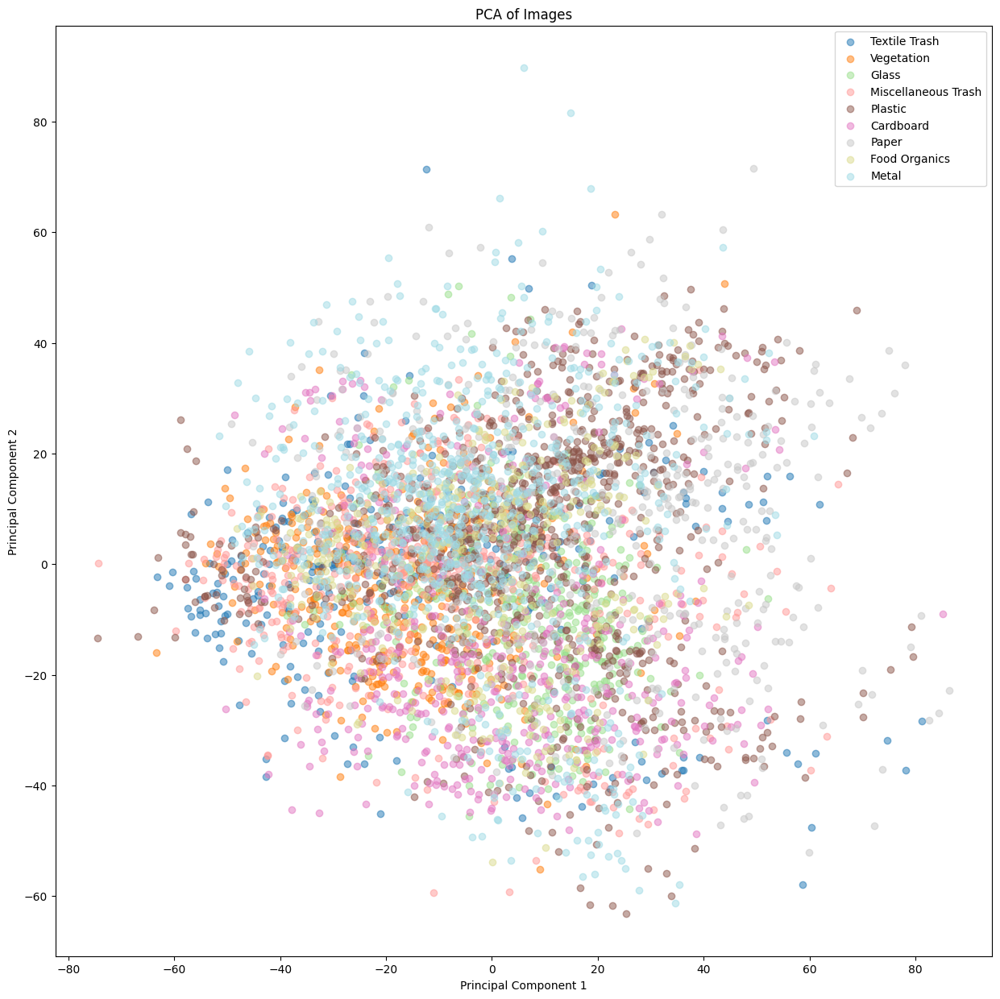

In [ ]:
# Eine Liste zur Speicherung der Bilddaten und Labels vorbereiten
image_data = []
labels = []

# Größe, auf die alle Bilder gebracht werden
img_size = (64, 64)

# Bilder laden und vorverarbeiten
for class_name in os.listdir(data_path):
    class_path = os.path.join(data_path, class_name)
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            # Bild laden
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            # Bildgröße ändern
            img = cv2.resize(img, img_size)
            # Bild zu einem Vektor flatten
            img_flattened = img.flatten()
            # Bilder und Labels in die Listen einfügen
            image_data.append(img_flattened)
            labels.append(class_name)

# Daten normalisieren
scaler = StandardScaler()
image_data_scaled = scaler.fit_transform(image_data)

# PCA durchführen
pca = PCA(n_components=2)  # Wir reduzieren auf 2 Komponenten
principal_components = pca.fit_transform(image_data_scaled)

# Ergebnisse plotten
plt.figure(figsize=(15, 15))
cmap = plt.get_cmap('tab20')
colors = [cmap(i) for i in np.linspace(0, 1, len(set(labels)))]
for i, class_name in enumerate(set(labels)):
    indices = [j for j, label in enumerate(labels) if label == class_name]
    plt.scatter(principal_components[indices, 0], principal_components[indices, 1], color=colors[i], alpha=0.5, label=class_name)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Images')
plt.legend()
plt.show()

## Flemming: Klassische ML-Verfahren

### Import erforderlicher Module

In [ ]:
import tensorflow as tf
import numpy as np
import sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import cv2
import random
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


# Der Pfad zum aktuellen Verzeichnis
current_directory = os.getcwd()
print("Current Directory:", current_directory)

# Der Pfad zum Datenverzeichnis
data_directory = os.path.join(current_directory, '/content/drive/My Drive/RealWaste')
print("Data Directory:", data_directory)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current Directory: /content
Data Directory: /content/drive/My Drive/RealWaste


### Bilder Laden und vorverarbeiten

In [ ]:
# Listen für die Daten und Labels erstellen
data = []
labels = []

# Die Namen der Klassen-Unterordner auslesen
class_directories = [d for d in os.listdir(data_directory) if os.path.isdir(os.path.join(data_directory, d))]

# Durch die Klassen-Unterordner iterieren
for class_dir in class_directories:
    # Vollständige Pfade zu den Bildern im Klassen-Unterordner generieren
    image_paths = [os.path.join(data_directory, class_dir, f) for f in os.listdir(os.path.join(data_directory, class_dir)) if f.endswith('.jpg')]

    # Bilder laden und vorverarbeiten
    for image_path in image_paths:
        # Bild laden
        image = cv2.imread(image_path)
        if image is None:  # Prüfe ob das Bild korrekt geladen wurde
            continue  # Wenn nicht, überspringe diesen Durchlauf
        # Bild in Graustufen umwandeln
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Bild auf eine einheitliche Größe bringen (z.B. 64x64)
        resized_image = cv2.resize(gray_image, (64, 64))
        # Bild in einen Vektor umwandeln
        flat_image = resized_image.flatten()
        # Den Vektor zu den Daten hinzufügen
        data.append(flat_image)
        # Das Label hinzufügen (der Name des Unterordners)
        labels.append(class_dir)

# Daten und Labels in Numpy-Arrays umwandeln
data = np.array(data)
labels = np.array(labels)

print(f"Daten geladen: {data.shape}")
print(f"Labels geladen: {labels.shape}")


Daten geladen: (4752, 4096)
Labels geladen: (4752,)


### Aufteilung von Trainings- und Testdaten

In [ ]:
# Aufteilung der Daten in Trainings- und Testsets
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

print("Aufteilung in Trainings- und Testdaten abgeschlossen!")
print(f"Trainingsdaten: {X_train.shape}")
print(f"Testdaten: {X_test.shape}")


Aufteilung in Trainings- und Testdaten abgeschlossen!
Trainingsdaten: (3801, 4096)
Testdaten: (951, 4096)


### Training für RandomForestClassifier

In [ ]:
# Random Forest Klassifikator initialisieren
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Training des Klassifikators mit den Trainingsdaten
rf_classifier.fit(X_train, y_train)

print("Training abgeschlossen!")


Training abgeschlossen!


### Evaluation des Modells (RandomForestClassifier)

Genauigkeit: 0.58


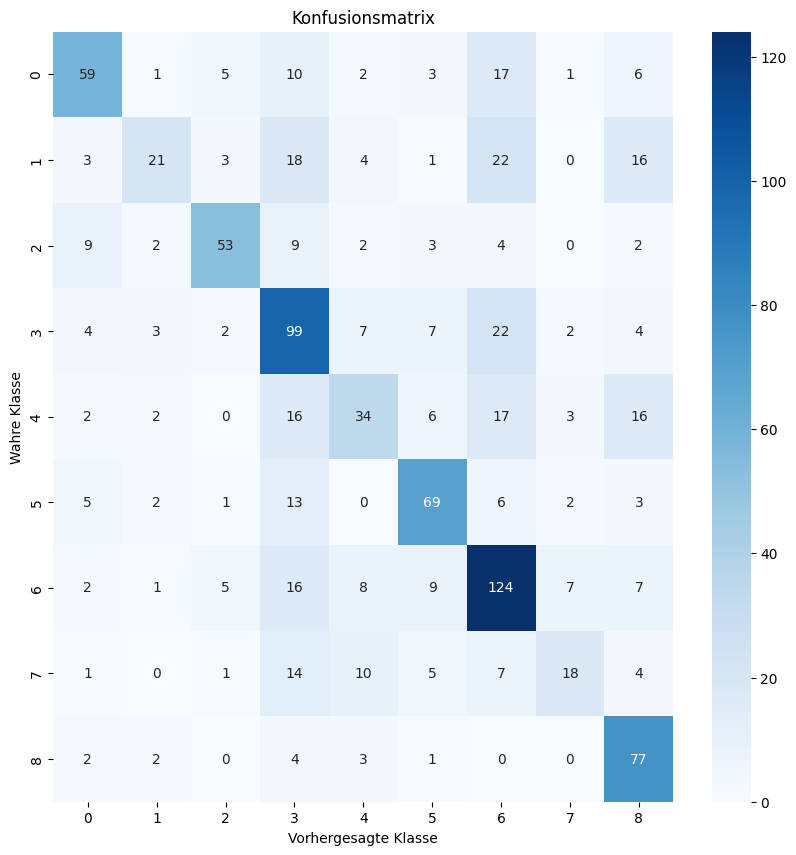

In [ ]:
# Vorhersagen auf dem Testset machen
y_pred = rf_classifier.predict(X_test)

# Genauigkeit berechnen
accuracy = accuracy_score(y_test, y_pred)
print(f"Genauigkeit: {accuracy:.2f}")

# Konfusionsmatrix erstellen
conf_matrix = confusion_matrix(y_test, y_pred)

# Konfusionsmatrix visualisieren
plt.figure(figsize=(10, 10))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Konfusionsmatrix")
plt.ylabel("Wahre Klasse")
plt.xlabel("Vorhergesagte Klasse")
plt.show()


Genauigkeit: 0.58


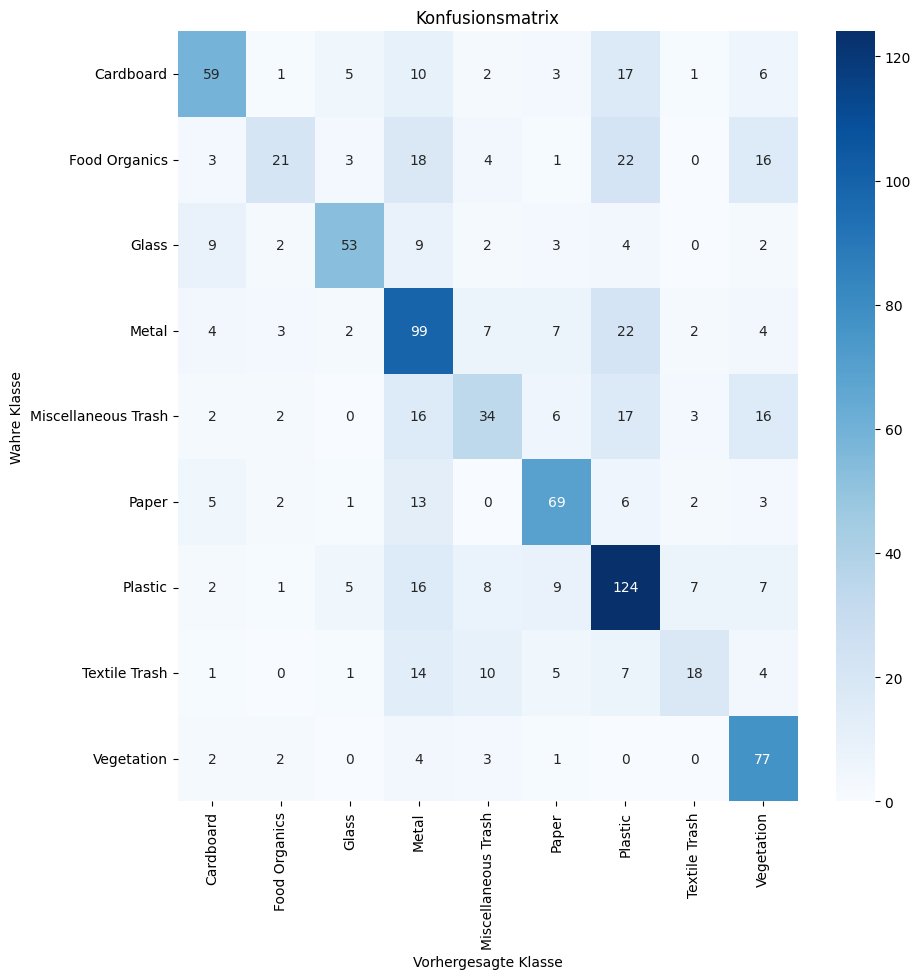

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Vorhersagen auf dem Testset machen
y_pred = rf_classifier.predict(X_test)

# Genauigkeit berechnen
accuracy = accuracy_score(y_test, y_pred)
print(f"Genauigkeit: {accuracy:.2f}")

# Konfusionsmatrix erstellen
conf_matrix = confusion_matrix(y_test, y_pred, labels=rf_classifier.classes_)

# Klassenbeschriftungen aus dem Klassifikator holen
class_labels = rf_classifier.classes_

# Konfusionsmatrix visualisieren
plt.figure(figsize=(10, 10))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfusionsmatrix")
plt.ylabel("Wahre Klasse")
plt.xlabel("Vorhergesagte Klasse")
plt.yticks(rotation=0)  # Dreht die Beschriftungen auf der Y-Achse um 90 Grad
plt.show()


### Feature Engineering

#### Histogram of Oriented Gradients (HOG)

In [ ]:
pip install scikit-image

Ausgewähltes Bild: /content/drive/My Drive/RealWaste/Plastic/Plastic_556.jpg


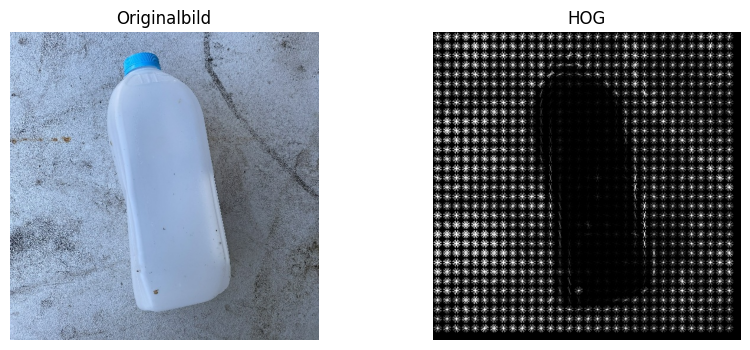

In [ ]:
import os
import random
import cv2
from skimage.feature import hog
from skimage import exposure
import matplotlib.pyplot as plt

# Der Pfad zum Datenverzeichnis, der bereits definiert ist
data_directory = '/content/drive/My Drive/RealWaste'

# Die Namen der Klassen-Unterordner auslesen
class_directories = [d for d in os.listdir(data_directory) if os.path.isdir(os.path.join(data_directory, d))]

# Vollständige Pfade zu allen Bildern in allen Klassen-Unterordnern generieren
all_image_paths = []
for class_dir in class_directories:
    image_paths = [os.path.join(data_directory, class_dir, f) for f in os.listdir(os.path.join(data_directory, class_dir)) if f.endswith('.jpg')]
    all_image_paths.extend(image_paths)

# Überprüfe, ob die Liste der Bildpfade leer ist
if not all_image_paths:
    print("Keine .jpg-Dateien in den Unterordnern gefunden. Überprüfe den Pfad und das Dateiformat.")
else:
    # Ein zufälliges Bild auswählen
    random_image_path = random.choice(all_image_paths)
    print("Ausgewähltes Bild:", random_image_path)

    # Das ausgewählte Bild laden
    image = cv2.imread(random_image_path)

    # Sicherstellen, dass das Bild korrekt geladen wurde
    if image is None:
        print("Bild konnte nicht geladen werden.")
    else:
        # Bild in Graustufen umwandeln
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # HOG-Feature-Extraktion ohne channel_axis
        fd, hog_image = hog(gray_image, orientations=8, pixels_per_cell=(16, 16),
                            cells_per_block=(1, 1), visualize=True)

        # Verbessere die Visualisierung des HOG-Bildes
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

        # Anzeigen des Originalbildes und des HOG-Bildes
        plt.figure(figsize=(10, 4))
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Konvertiere BGR zu RGB für die korrekte Anzeige
        plt.title('Originalbild')
        plt.axis('off')

        plt.subplot(122)
        plt.imshow(hog_image_rescaled, cmap='gray')
        plt.title('HOG')
        plt.axis('off')

        plt.show()


#### Hog-Feature-Extraktionsprozess auf den gesamten Datensatz anwenden
**FLR 18.02.2024**: Ich musste leider abbrechen, wahrscheinlich zu rechenintensiv.

In [ ]:
from skimage.feature import hog
import numpy as np
import os
import cv2

def extract_hog_features(image_paths):
    data = []
    labels = []

    for image_path in image_paths:
        # Bild laden
        image = cv2.imread(image_path)
        if image is None:
            continue  # Wenn das Bild nicht geladen werden kann, überspringen wir es

        # Bild in Graustufen umwandeln
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # HOG-Features extrahieren
        fd = hog(gray_image, orientations=8, pixels_per_cell=(16, 16),
                 cells_per_block=(1, 1), visualize=False)
        # Die extrahierten Features zur Liste hinzufügen
        data.append(fd)
        # Das Label hinzufügen (Name des Unterordners)
        label = os.path.basename(os.path.dirname(image_path))
        labels.append(label)

    return np.array(data), np.array(labels)

# Die Namen der Klassen-Unterordner auslesen
class_directories = [d for d in os.listdir(data_directory) if os.path.isdir(os.path.join(data_directory, d))]

# Vollständige Pfade zu allen Bildern in allen Klassen-Unterordnern generieren
all_image_paths = []
for class_dir in class_directories:
    image_paths = [os.path.join(data_directory, class_dir, f) for f in os.listdir(os.path.join(data_directory, class_dir)) if f.endswith('.jpg')]
    all_image_paths.extend(image_paths)

# Überprüfe, ob es Bilder gibt
if not all_image_paths:
    print("Keine Bilder zum Verarbeiten gefunden.")
else:
    # Extrahiere die HOG-Features für alle Bilder
    data, labels = extract_hog_features(all_image_paths)
    print("HOG-Features extrahiert. Größe der Feature-Daten:", data.shape)


HOG-Features extrahiert. Größe der Feature-Daten: (4752, 8192)


                     precision    recall  f1-score   support

          Cardboard       0.61      0.19      0.29       104
      Food Organics       0.37      0.18      0.24        88
              Glass       0.79      0.54      0.64        84
              Metal       0.36      0.49      0.41       150
Miscellaneous Trash       0.26      0.05      0.09        96
              Paper       0.67      0.26      0.37       101
            Plastic       0.29      0.80      0.43       179
      Textile Trash       0.00      0.00      0.00        60
         Vegetation       0.46      0.35      0.40        89

           accuracy                           0.38       951
          macro avg       0.42      0.32      0.32       951
       weighted avg       0.42      0.38      0.34       951



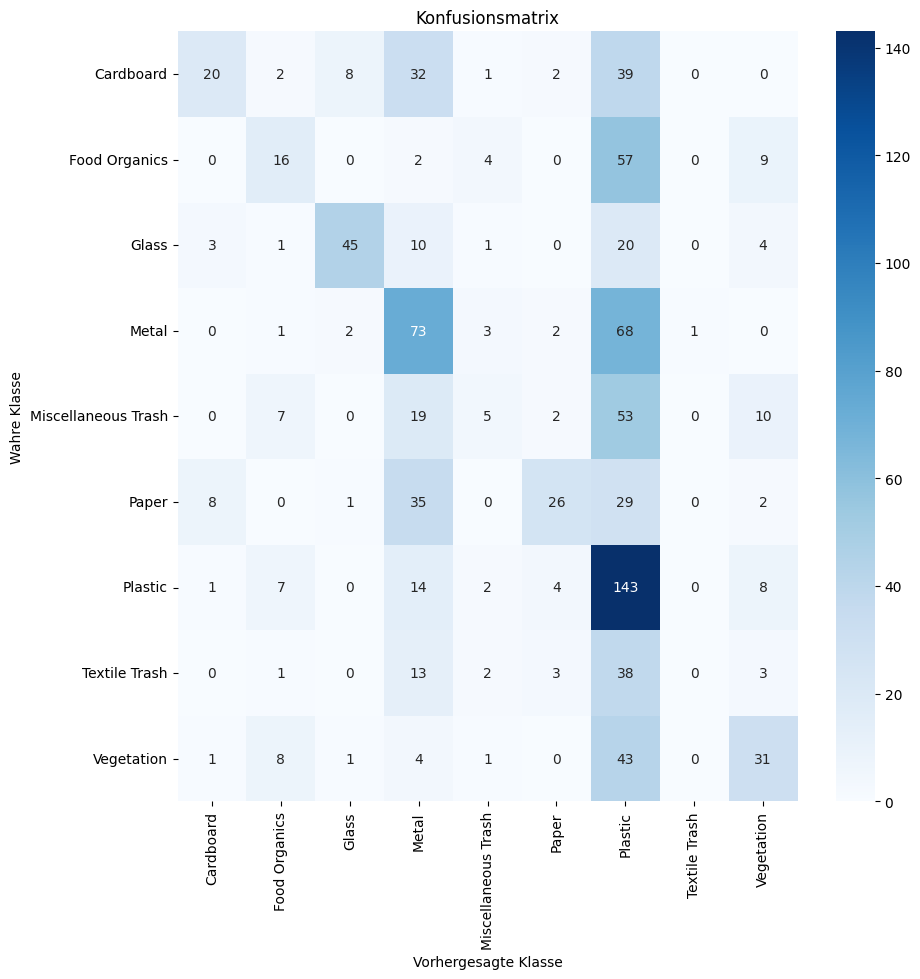

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Daten in Trainings- und Testsets aufteilen
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# Random Forest Klassifikator initialisieren
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Modell trainieren
clf.fit(X_train, y_train)

# Vorhersagen auf dem Testset machen
y_pred = clf.predict(X_test)

# Bewertungsmetriken ausgeben
print(classification_report(y_test, y_pred))

# Konfusionsmatrix erstellen und visualisieren
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title("Konfusionsmatrix")
plt.ylabel("Wahre Klasse")
plt.xlabel("Vorhergesagte Klasse")
plt.show()


### Local Binary Patterns (LBP)

In [ ]:
from skimage.feature import local_binary_pattern
from skimage import color
import numpy as np
import os
import cv2

# Parameter für LBP
radius = 3
n_points = 8 * radius

def extract_lbp_features(image_paths):
    data = []
    labels = []

    for image_path in image_paths:
        # Bild laden
        image = cv2.imread(image_path)
        if image is None:
            continue  # Wenn das Bild nicht geladen werden kann, überspringen wir es

        # Bild in Graustufen umwandeln
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # LBP-Features extrahieren
        lbp = local_binary_pattern(gray_image, n_points, radius, method="uniform")

        # Berechne das Histogramm der LBP-Features
        (hist, _) = np.histogram(lbp.ravel(),
                                 bins=np.arange(0, n_points + 3),
                                 range=(0, n_points + 2))

        # Normalisiere das Histogramm
        hist = hist.astype("float")
        hist /= (hist.sum() + 1e-6)

        # Die extrahierten Features zur Liste hinzufügen
        data.append(hist)

        # Das Label hinzufügen (Name des Unterordners)
        label = os.path.basename(os.path.dirname(image_path))
        labels.append(label)

    return np.array(data), np.array(labels)

# Die Namen der Klassen-Unterordner auslesen
class_directories = [d for d in os.listdir(data_directory) if os.path.isdir(os.path.join(data_directory, d))]

# Vollständige Pfade zu allen Bildern in allen Klassen-Unterordnern generieren
all_image_paths = []
for class_dir in class_directories:
    image_paths = [os.path.join(data_directory, class_dir, f) for f in os.listdir(os.path.join(data_directory, class_dir)) if f.endswith('.jpg')]
    all_image_paths.extend(image_paths)

# Überprüfe, ob es Bilder gibt
if not all_image_paths:
    print("Keine Bilder zum Verarbeiten gefunden.")
else:
    # Extrahiere die LBP-Features für alle Bilder
    data, labels = extract_lbp_features(all_image_paths)
    print("LBP-Features extrahiert. Größe der Feature-Daten:", data.shape)


LBP-Features extrahiert. Größe der Feature-Daten: (4752, 26)


Daten aufteilen, Modell trainieren, Modell evaluieren

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Daten in Trainings- und Testsets aufteilen
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# Random Forest Klassifikator initialisieren
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Modell trainieren
clf.fit(X_train, y_train)

# Vorhersagen für das Testset machen
y_pred = clf.predict(X_test)

# Genauigkeit bewerten
accuracy = accuracy_score(y_test, y_pred)
print(f"Modellgenauigkeit: {accuracy:.2%}")


Modellgenauigkeit: 59.73%


--> Modellgenauigkeit: 59.73%

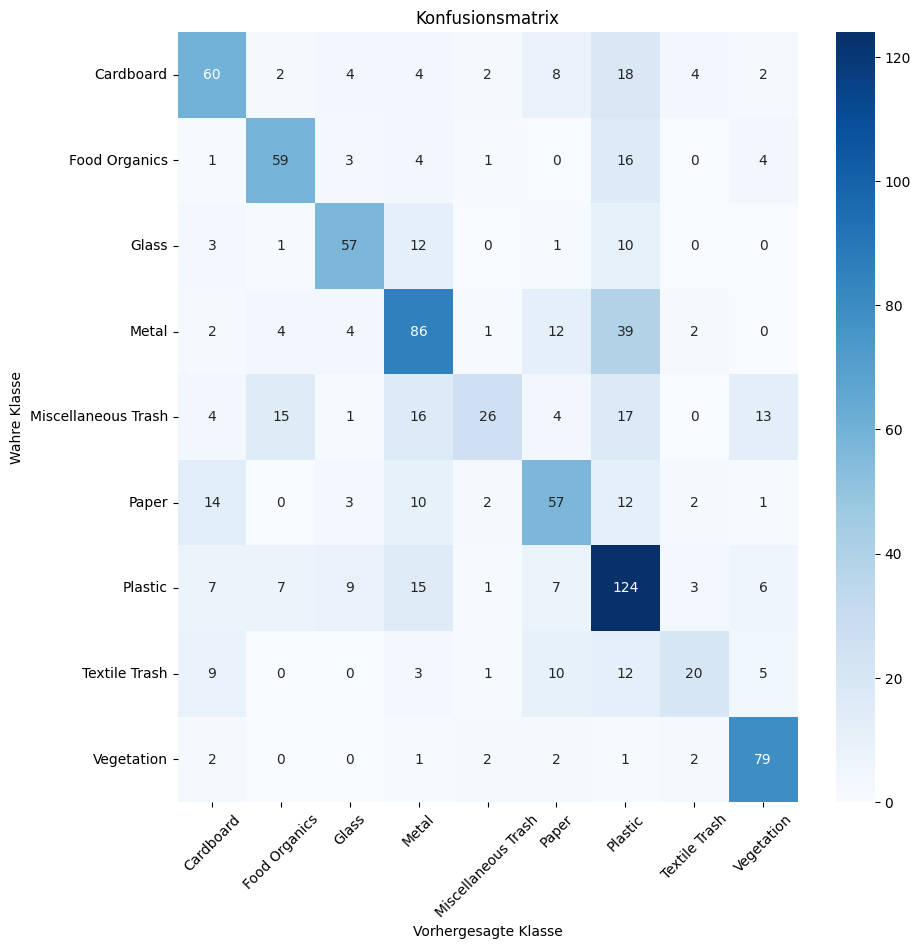

In [ ]:
# Konfusionsmatrix erstellen
conf_matrix = confusion_matrix(y_test, y_pred, labels=clf.classes_)

# Klassenbeschriftungen aus dem Klassifikator holen
class_labels = clf.classes_

# Konfusionsmatrix visualisieren
plt.figure(figsize=(10, 10))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfusionsmatrix")
plt.ylabel("Wahre Klasse")
plt.xlabel("Vorhergesagte Klasse")
plt.xticks(rotation=45)  # Dreht die Beschriftungen auf der X-Achse um 45 Grad für bessere Lesbarkeit
plt.yticks(rotation=0)  # Y-Achsen-Beschriftungen bleiben ungedreht
plt.show()

###